### Customer Personality Analysis with exploratory data analysis (EDA)

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Read that data into Python and call the dataframe.
df = pd.read_csv("Customer Data.csv")
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,4/9/2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,8/3/2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10/2/2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,13-06-2013,46,709,...,5,0,0,0,0,0,0,3,11,0
2236,4001,1946,PhD,Together,64014.0,2,1,10/6/2014,56,406,...,7,0,0,0,1,0,0,3,11,0
2237,7270,1981,Graduation,Divorced,56981.0,0,0,25-01-2014,91,908,...,6,0,1,0,0,0,0,3,11,0
2238,8235,1956,Master,Together,69245.0,0,1,24-01-2014,8,428,...,3,0,0,0,0,0,0,3,11,0


### Data cleaning

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [4]:
#I check the Null values in my df
df.isnull().any()

ID                     False
Year_Birth             False
Education              False
Marital_Status         False
Income                  True
Kidhome                False
Teenhome               False
Dt_Customer            False
Recency                False
MntWines               False
MntFruits              False
MntMeatProducts        False
MntFishProducts        False
MntSweetProducts       False
MntGoldProds           False
NumDealsPurchases      False
NumWebPurchases        False
NumCatalogPurchases    False
NumStorePurchases      False
NumWebVisitsMonth      False
AcceptedCmp3           False
AcceptedCmp4           False
AcceptedCmp5           False
AcceptedCmp1           False
AcceptedCmp2           False
Complain               False
Z_CostContact          False
Z_Revenue              False
Response               False
dtype: bool

In [5]:
df.isnull().any().sum()

1

In [6]:
null_count = df['Income'].isnull().sum()

print("Number of null values in 'Income':", null_count)

Number of null values in 'Income': 24


In [7]:
# Because I have enough data I can delete 24 values with Null.
df.dropna(subset=['Income'], inplace=True)
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,4/9/2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,8/3/2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10/2/2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,13-06-2013,46,709,...,5,0,0,0,0,0,0,3,11,0
2236,4001,1946,PhD,Together,64014.0,2,1,10/6/2014,56,406,...,7,0,0,0,1,0,0,3,11,0
2237,7270,1981,Graduation,Divorced,56981.0,0,0,25-01-2014,91,908,...,6,0,1,0,0,0,0,3,11,0
2238,8235,1956,Master,Together,69245.0,0,1,24-01-2014,8,428,...,3,0,0,0,0,0,0,3,11,0


In [8]:
unique_z_cost_contact_column_values = df['Z_CostContact'].unique()
print(unique_z_cost_contact_column_values)

[3]


In [9]:
unique_z_revenue_column_values = df['Z_Revenue'].unique()
print(unique_z_revenue_column_values)

[11]


In [10]:
# The columns 'Z_CostContact' and 'Z_Revenue' have the same data. Also it will be not influence my analyze.I delate the both.
columns_to_drop = ['Z_Revenue', 'Z_CostContact']
df.drop(columns_to_drop, axis=1, inplace=True)

In [11]:
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,5524,1957,Graduation,Single,58138.0,0,0,4/9/2012,58,635,...,10,4,7,0,0,0,0,0,0,1
1,2174,1954,Graduation,Single,46344.0,1,1,8/3/2014,38,11,...,1,2,5,0,0,0,0,0,0,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,2,10,4,0,0,0,0,0,0,0
3,6182,1984,Graduation,Together,26646.0,1,0,10/2/2014,26,11,...,0,4,6,0,0,0,0,0,0,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,3,6,5,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,13-06-2013,46,709,...,3,4,5,0,0,0,0,0,0,0
2236,4001,1946,PhD,Together,64014.0,2,1,10/6/2014,56,406,...,2,5,7,0,0,0,1,0,0,0
2237,7270,1981,Graduation,Divorced,56981.0,0,0,25-01-2014,91,908,...,3,13,6,0,1,0,0,0,0,0
2238,8235,1956,Master,Together,69245.0,0,1,24-01-2014,8,428,...,5,10,3,0,0,0,0,0,0,0


In [12]:
# I check duplicate
duplicate_rows = df.duplicated(keep=False)
print(df[duplicate_rows])

Empty DataFrame
Columns: [ID, Year_Birth, Education, Marital_Status, Income, Kidhome, Teenhome, Dt_Customer, Recency, MntWines, MntFruits, MntMeatProducts, MntFishProducts, MntSweetProducts, MntGoldProds, NumDealsPurchases, NumWebPurchases, NumCatalogPurchases, NumStorePurchases, NumWebVisitsMonth, AcceptedCmp3, AcceptedCmp4, AcceptedCmp5, AcceptedCmp1, AcceptedCmp2, Complain, Response]
Index: []

[0 rows x 27 columns]


In [13]:
df.nunique()

ID                     2216
Year_Birth               59
Education                 5
Marital_Status            8
Income                 1974
Kidhome                   3
Teenhome                  3
Dt_Customer             662
Recency                 100
MntWines                776
MntFruits               158
MntMeatProducts         554
MntFishProducts         182
MntSweetProducts        176
MntGoldProds            212
NumDealsPurchases        15
NumWebPurchases          15
NumCatalogPurchases      14
NumStorePurchases        14
NumWebVisitsMonth        16
AcceptedCmp3              2
AcceptedCmp4              2
AcceptedCmp5              2
AcceptedCmp1              2
AcceptedCmp2              2
Complain                  2
Response                  2
dtype: int64

In [14]:
df = df.reindex(columns=['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome', 'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'Complain', 'Response'
                         ])
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp1,AcceptedCmp2,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,Complain,Response
0,5524,1957,Graduation,Single,58138.0,0,0,4/9/2012,58,635,...,10,4,7,0,0,0,0,0,0,1
1,2174,1954,Graduation,Single,46344.0,1,1,8/3/2014,38,11,...,1,2,5,0,0,0,0,0,0,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,2,10,4,0,0,0,0,0,0,0
3,6182,1984,Graduation,Together,26646.0,1,0,10/2/2014,26,11,...,0,4,6,0,0,0,0,0,0,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,3,6,5,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,13-06-2013,46,709,...,3,4,5,0,0,0,0,0,0,0
2236,4001,1946,PhD,Together,64014.0,2,1,10/6/2014,56,406,...,2,5,7,1,0,0,0,0,0,0
2237,7270,1981,Graduation,Divorced,56981.0,0,0,25-01-2014,91,908,...,3,13,6,0,0,0,1,0,0,0
2238,8235,1956,Master,Together,69245.0,0,1,24-01-2014,8,428,...,5,10,3,0,0,0,0,0,0,0


In [15]:
# Only 2 values + not relevant + not understandable
df = df.drop(df[df['Marital_Status'] == 'Absurd'].index)

In [16]:
# Only 2 values + not relevant + not understandable
df = df.drop(df[df['Marital_Status'] == 'YOLO'].index)

In [17]:
marital_counts = df['Marital_Status'].value_counts()
print(marital_counts)

Married     857
Together    573
Single      471
Divorced    232
Widow        76
Alone         3
Name: Marital_Status, dtype: int64


In [18]:
# Transform Dt_Customer to datetime.
df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'])

# The values in Dt_Customer colum have different format.Extract year and create a new column 'Year_Customer'
df['Year_Customer'] = df['Dt_Customer'].dt.year

print(df)


         ID  Year_Birth   Education Marital_Status   Income  Kidhome  \
0      5524        1957  Graduation         Single  58138.0        0   
1      2174        1954  Graduation         Single  46344.0        1   
2      4141        1965  Graduation       Together  71613.0        0   
3      6182        1984  Graduation       Together  26646.0        1   
4      5324        1981         PhD        Married  58293.0        1   
...     ...         ...         ...            ...      ...      ...   
2235  10870        1967  Graduation        Married  61223.0        0   
2236   4001        1946         PhD       Together  64014.0        2   
2237   7270        1981  Graduation       Divorced  56981.0        0   
2238   8235        1956      Master       Together  69245.0        0   
2239   9405        1954         PhD        Married  52869.0        1   

      Teenhome Dt_Customer  Recency  MntWines  ...  NumStorePurchases  \
0            0  2012-04-09       58       635  ...            

C:\Users\ivann\AppData\Local\Temp\ipykernel_10736\208945895.py:2: UserWarning: Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.
  df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'])


In [19]:
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp1,AcceptedCmp2,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,Complain,Response,Year_Customer
0,5524,1957,Graduation,Single,58138.0,0,0,2012-04-09,58,635,...,4,7,0,0,0,0,0,0,1,2012
1,2174,1954,Graduation,Single,46344.0,1,1,2014-08-03,38,11,...,2,5,0,0,0,0,0,0,0,2014
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,...,10,4,0,0,0,0,0,0,0,2013
3,6182,1984,Graduation,Together,26646.0,1,0,2014-10-02,26,11,...,4,6,0,0,0,0,0,0,0,2014
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,...,6,5,0,0,0,0,0,0,0,2014
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,...,4,5,0,0,0,0,0,0,0,2013
2236,4001,1946,PhD,Together,64014.0,2,1,2014-10-06,56,406,...,5,7,1,0,0,0,0,0,0,2014
2237,7270,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,...,13,6,0,0,0,1,0,0,0,2014
2238,8235,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,...,10,3,0,0,0,0,0,0,0,2014


In [20]:
# I have the Year_Birth from customer. I create the columnt Age for better analyze, which customer we have.
import datetime

def calculate_age(Year_Birth):
    current_year = datetime.datetime.now().year
    age = current_year - Year_Birth
    return age

In [21]:
df['Age'] = df['Year_Birth'].apply(calculate_age)

In [22]:
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp1,AcceptedCmp2,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,Complain,Response,Year_Customer,Age
0,5524,1957,Graduation,Single,58138.0,0,0,2012-04-09,58,635,...,7,0,0,0,0,0,0,1,2012,66
1,2174,1954,Graduation,Single,46344.0,1,1,2014-08-03,38,11,...,5,0,0,0,0,0,0,0,2014,69
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,...,4,0,0,0,0,0,0,0,2013,58
3,6182,1984,Graduation,Together,26646.0,1,0,2014-10-02,26,11,...,6,0,0,0,0,0,0,0,2014,39
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,...,5,0,0,0,0,0,0,0,2014,42
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,...,5,0,0,0,0,0,0,0,2013,56
2236,4001,1946,PhD,Together,64014.0,2,1,2014-10-06,56,406,...,7,1,0,0,0,0,0,0,2014,77
2237,7270,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,...,6,0,0,0,1,0,0,0,2014,42
2238,8235,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,...,3,0,0,0,0,0,0,0,2014,67


In [23]:
# I save the new clean data as .csv
df.to_csv('Customer Data_clean.csv', index=False)

### Exploratory Data Analysis (EDA)

In [24]:
df.describe()

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,NumWebVisitsMonth,AcceptedCmp1,AcceptedCmp2,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,Complain,Response,Year_Customer,Age
count,2212.000000,2212.000000,2212.000000,2212.000000,2212.000000,2212.000000,2212.000000,2212.000000,2212.000000,2212.000000,...,2212.000000,2212.000000,2212.000000,2212.000000,2212.000000,2212.000000,2212.000000,2212.000000,2212.000000,2212.000000
mean,5587.731917,1968.811031,52232.510850,0.442586,0.505425,49.050633,305.030741,26.324593,166.970163,37.516275,...,5.320072,0.063743,0.013562,0.073689,0.074141,0.072785,0.009494,0.149638,2013.029385,54.188969
std,3247.944128,11.982065,25187.455359,0.537052,0.544258,28.940794,337.611255,39.781794,224.344950,54.558673,...,2.423445,0.244350,0.115691,0.261323,0.262060,0.259842,0.096994,0.356797,0.684879,11.982065
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2012.000000,27.000000
25%,2814.750000,1959.000000,35233.500000,0.000000,0.000000,24.000000,23.750000,1.750000,16.000000,3.000000,...,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2013.000000,46.000000
50%,5458.500000,1970.000000,51381.500000,0.000000,0.000000,49.000000,173.500000,8.000000,68.000000,12.000000,...,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2013.000000,53.000000
75%,8421.750000,1977.000000,68522.000000,1.000000,1.000000,74.000000,505.500000,33.000000,232.250000,50.000000,...,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2013.000000,64.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,...,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2014.000000,130.000000


### Numerical data analysis

In [25]:
number_of_occurrences = df[df['Complain'] >= 0.0]['Complain'].count()
print(number_of_occurrences)

2212


<Axes: >

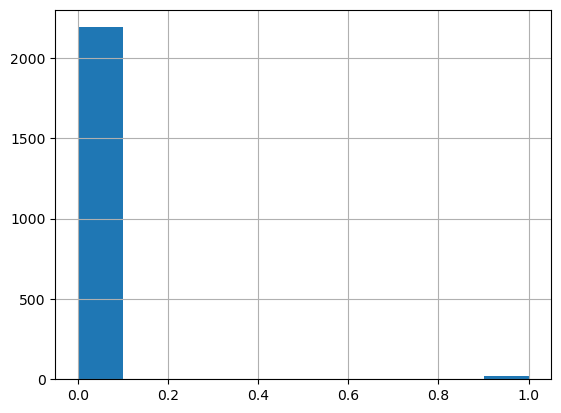

In [26]:
df['Complain'].hist()

In [27]:
# I delete the the both rows/Remove outlier.
df = df.drop(df[df['Income'] == 666666.000000].index)

In [28]:
df = df.drop(df[df['Income'] >= 200000.000000].index)

In [29]:
# Outlier in 'Year_Birth'. We have only 3 values <=1900/Remove outlier.
df = df.drop(df[df['Year_Birth'] <= 1900].index)

df = df.drop(df[df['MntMeatProducts'] >= 1500].index)

df = df.drop(df[df['MntGoldProds'] >= 250].index)

In [30]:
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp1,AcceptedCmp2,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,Complain,Response,Year_Customer,Age
0,5524,1957,Graduation,Single,58138.0,0,0,2012-04-09,58,635,...,7,0,0,0,0,0,0,1,2012,66
1,2174,1954,Graduation,Single,46344.0,1,1,2014-08-03,38,11,...,5,0,0,0,0,0,0,0,2014,69
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,...,4,0,0,0,0,0,0,0,2013,58
3,6182,1984,Graduation,Together,26646.0,1,0,2014-10-02,26,11,...,6,0,0,0,0,0,0,0,2014,39
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,...,5,0,0,0,0,0,0,0,2014,42
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,...,5,0,0,0,0,0,0,0,2013,56
2236,4001,1946,PhD,Together,64014.0,2,1,2014-10-06,56,406,...,7,1,0,0,0,0,0,0,2014,77
2237,7270,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,...,6,0,0,0,1,0,0,0,2014,42
2238,8235,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,...,3,0,0,0,0,0,0,0,2014,67


In [31]:
numerical_columns = df.select_dtypes(include='number').columns.tolist()

print("Numerical Columns:")
print(numerical_columns)

Numerical Columns:
['ID', 'Year_Birth', 'Income', 'Kidhome', 'Teenhome', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'Complain', 'Response', 'Year_Customer', 'Age']


ID
Skew : 0.04


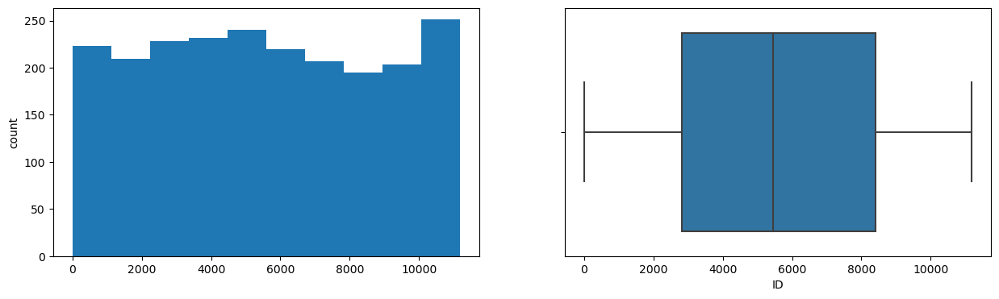

Year_Birth
Skew : -0.09


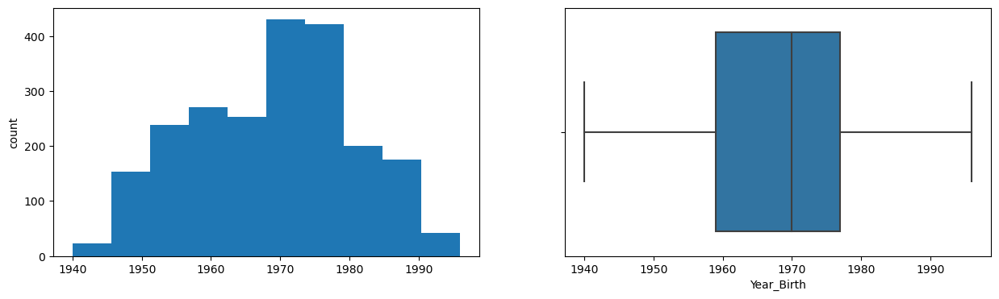

Income
Skew : 0.35


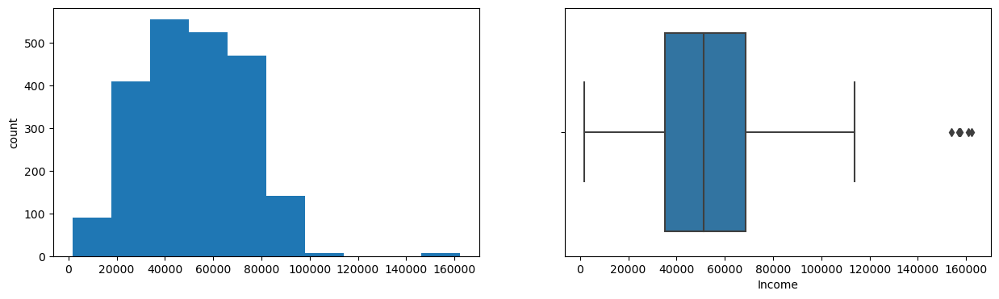

Kidhome
Skew : 0.63


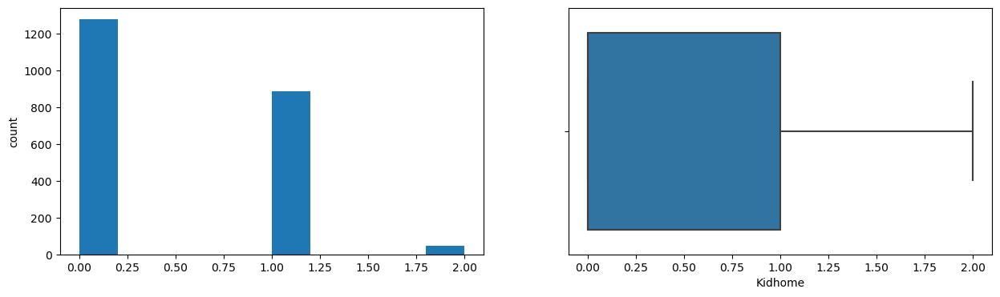

Teenhome
Skew : 0.41


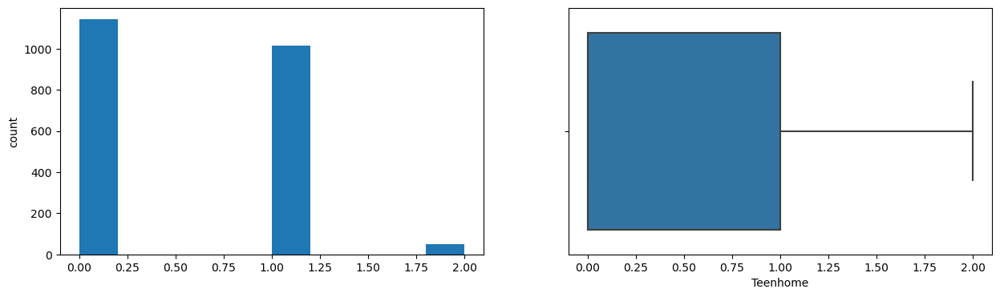

Recency
Skew : -0.0


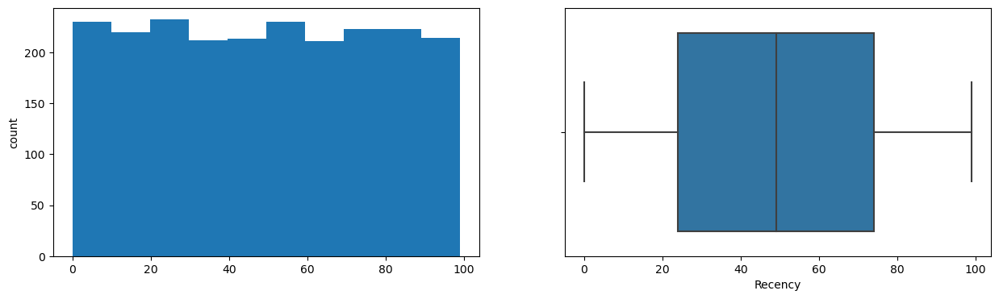

MntWines
Skew : 1.17


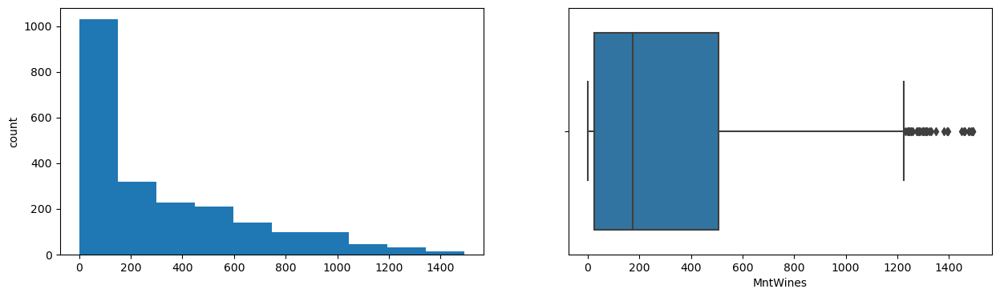

MntFruits
Skew : 2.11


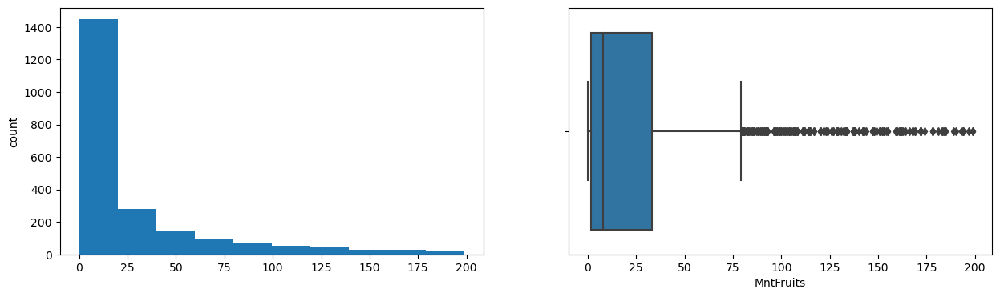

MntMeatProducts
Skew : 2.03


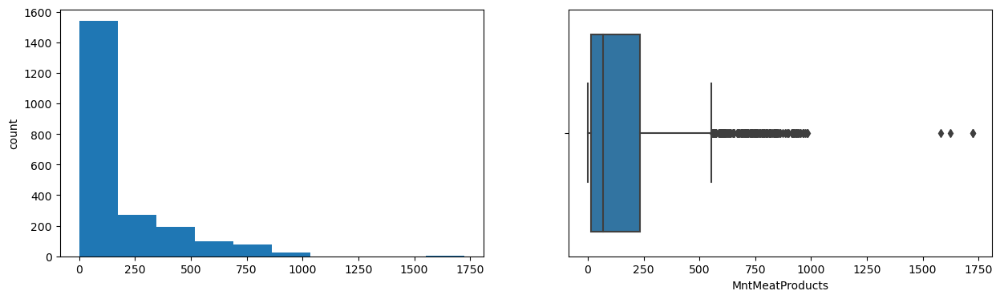

MntFishProducts
Skew : 1.92


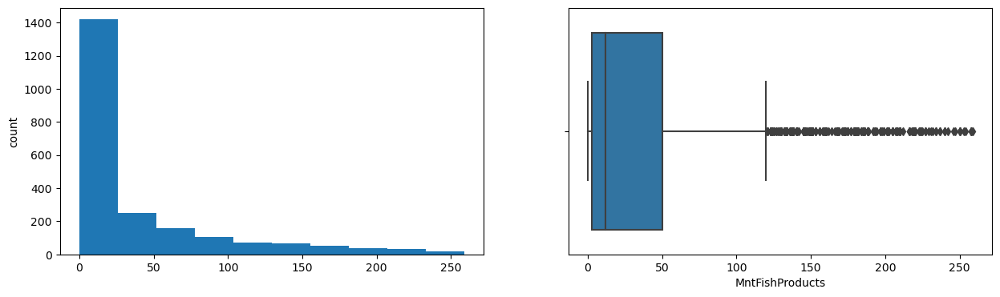

MntSweetProducts
Skew : 2.1


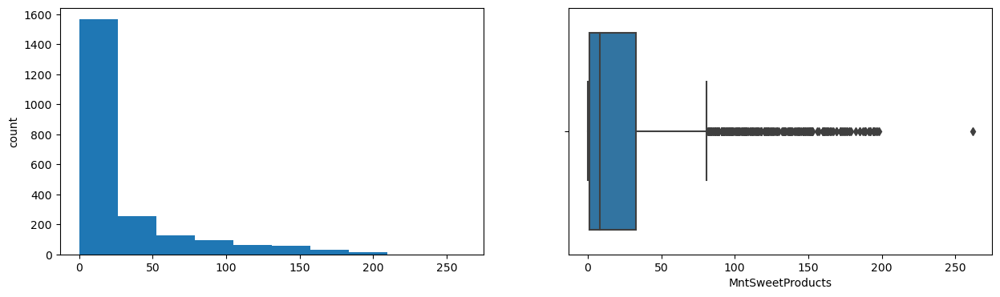

MntGoldProds
Skew : 1.84


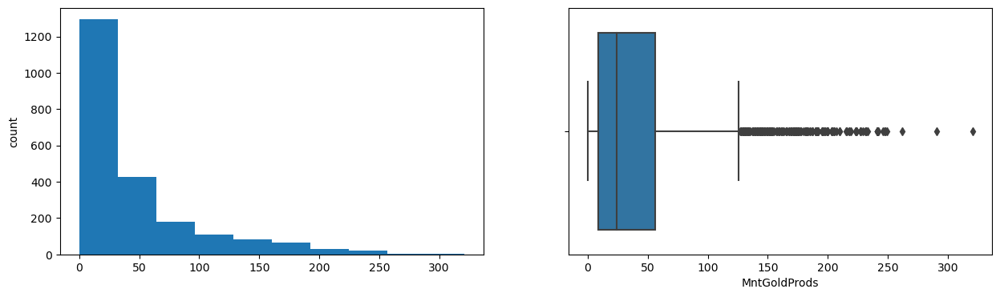

NumDealsPurchases
Skew : 2.42


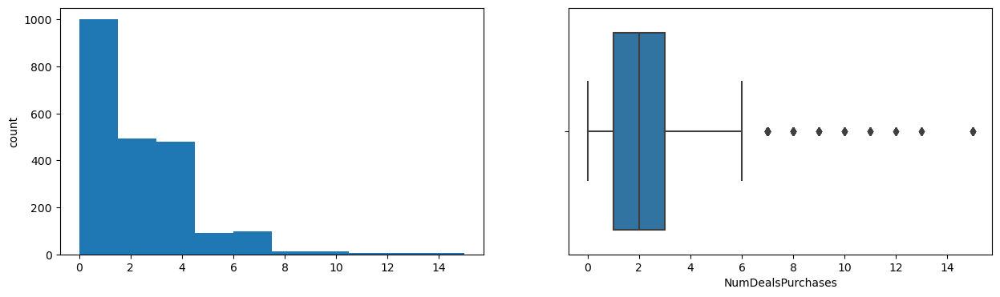

NumWebPurchases
Skew : 1.2


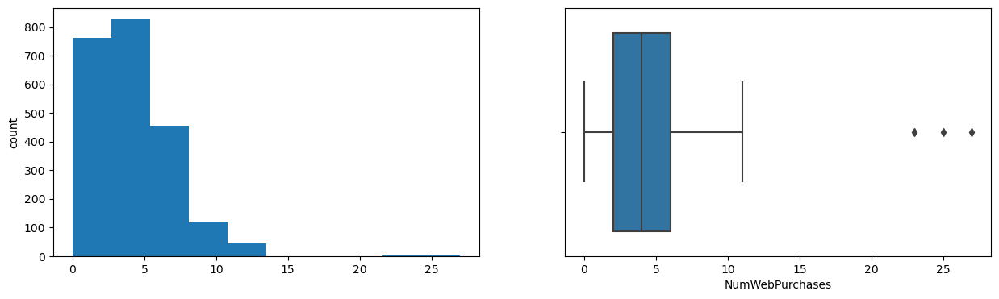

NumCatalogPurchases
Skew : 1.89


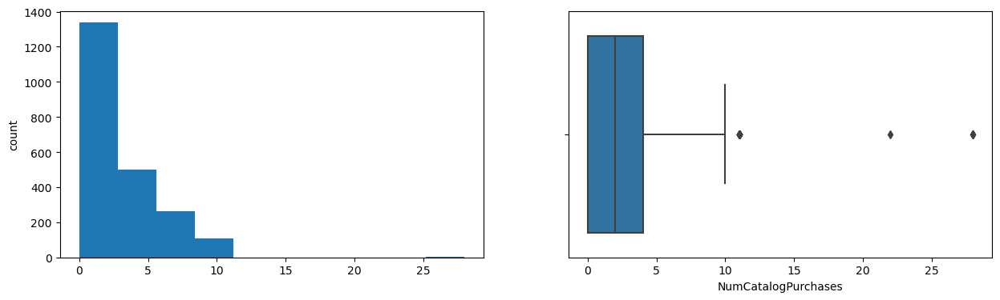

NumStorePurchases
Skew : 0.7


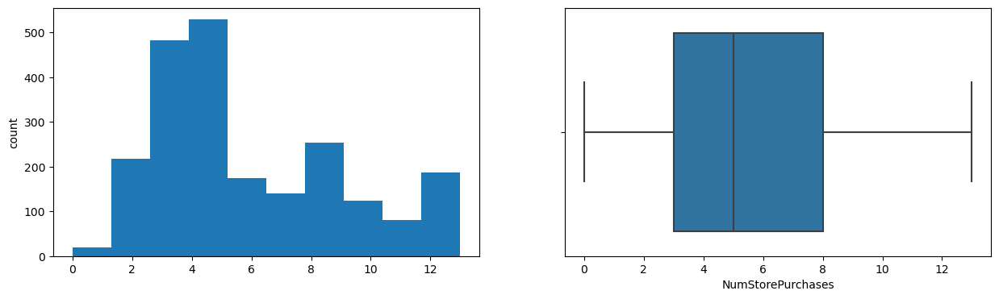

NumWebVisitsMonth
Skew : 0.22


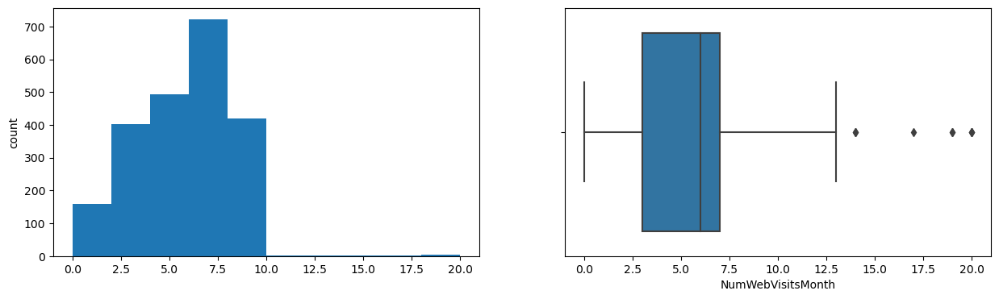

AcceptedCmp1
Skew : 3.57


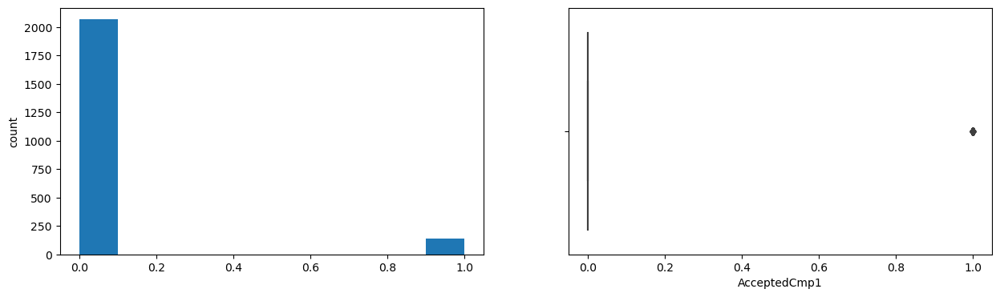

AcceptedCmp2
Skew : 8.41


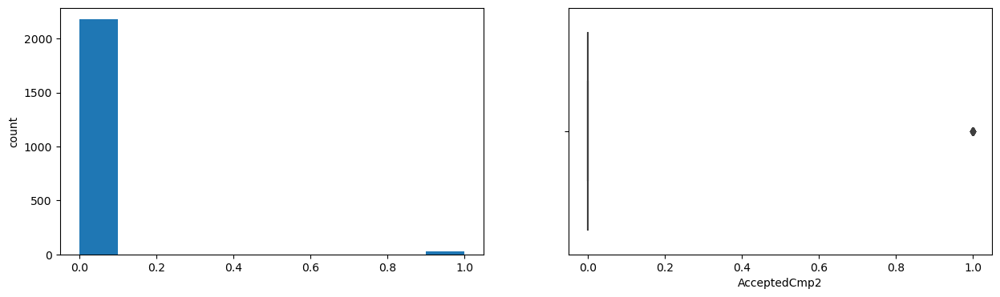

AcceptedCmp3
Skew : 3.26


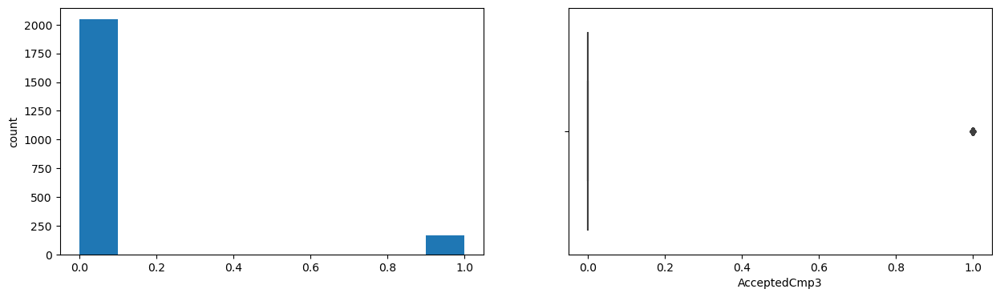

AcceptedCmp4
Skew : 3.25


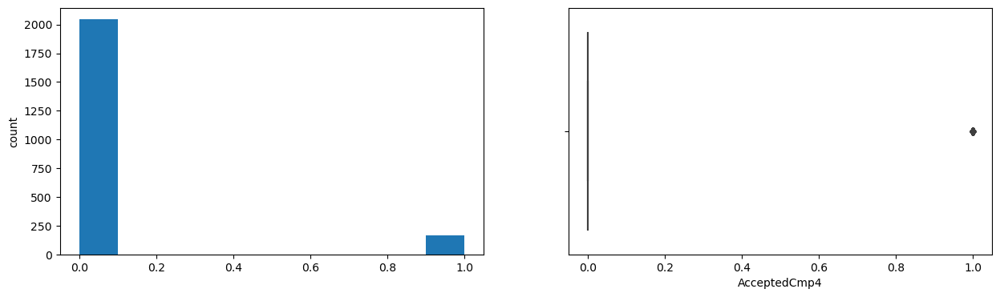

AcceptedCmp5
Skew : 3.3


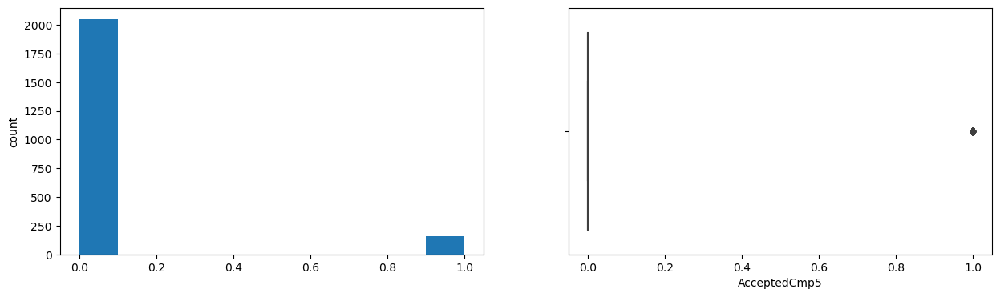

Complain
Skew : 10.37


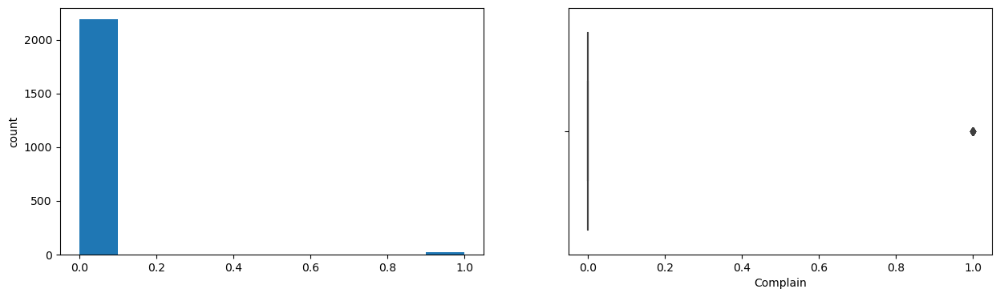

Response
Skew : 1.96


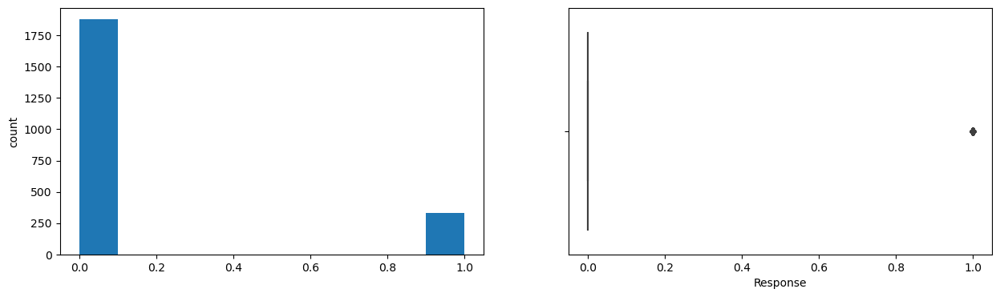

Year_Customer
Skew : -0.04


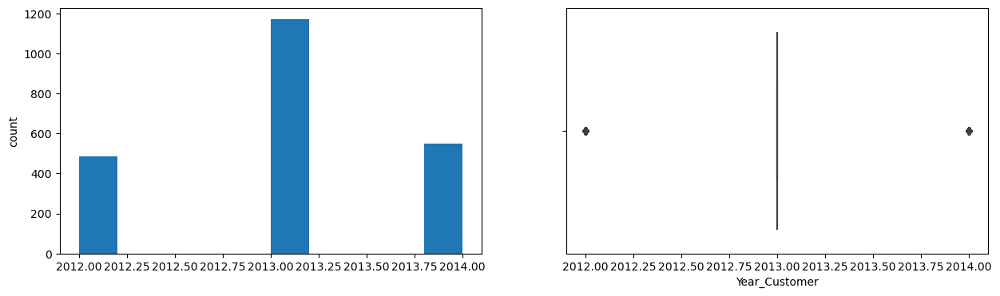

Age
Skew : 0.09


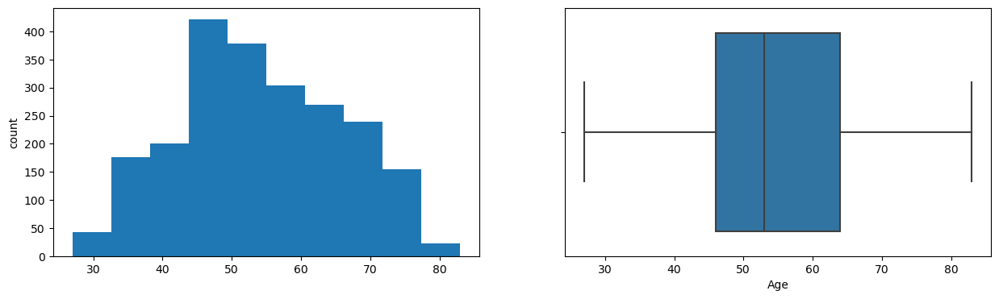

In [32]:
for col in numerical_columns:
    print(col)
    print('Skew :', round(df[col].skew(), 2))
    plt.figure(figsize = (15, 4))
    plt.subplot(1, 2, 1)
    df[col].hist(grid=False)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.boxplot(x=df[col])
    plt.show()

What is the main age group of our customers? - The customers between 35 - 75 years old.
What is the best sales channel? - NumStorePurchases
How looks the WebChanel? - Web Visits look positive. But it does not look evenly proportional with NumWebPurchases.

### Categorical data analysis

In [33]:
df.describe(include='all')

C:\Users\ivann\AppData\Local\Temp\ipykernel_10736\2884002236.py:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  df.describe(include='all')


,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp1,AcceptedCmp2,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,Complain,Response,Year_Customer,Age
count,2208.000000,2208.000000,2208,2208,2208.000000,2208.000000,2208.000000,2208,2208.000000,2208.000000,...,2208.000000,2208.000000,2208.000000,2208.000000,2208.000000,2208.000000,2208.000000,2208.000000,2208.000000,2208.000000
unique,NaN,NaN,5,6,NaN,NaN,NaN,662,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,Graduation,Married,NaN,NaN,NaN,2012-08-31 00:00:00,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,1114,857,NaN,NaN,NaN,12,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
first,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2012-01-08 00:00:00,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2014-12-06 00:00:00,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,5584.532609,1968.904438,NaN,NaN,51943.520833,0.442482,0.505888,NaN,49.057518,305.226902,...,5.322464,0.063859,0.013587,0.073822,0.074275,0.072464,0.009058,0.149909,2013.028986,54.095562
std,3246.084196,11.697572,NaN,NaN,21536.756816,0.537112,0.544330,NaN,28.935531,337.606819,...,2.423679,0.244556,0.115795,0.261541,0.262278,0.259313,0.094763,0.357063,0.685187,11.697572
min,0.000000,1940.000000,NaN,NaN,1730.000000,0.000000,0.000000,NaN,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2012.000000,27.000000
25%,2814.750000,1959.000000,NaN,NaN,35196.000000,0.000000,0.000000,NaN,24.000000,24.000000,...,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2013.000000,46.000000


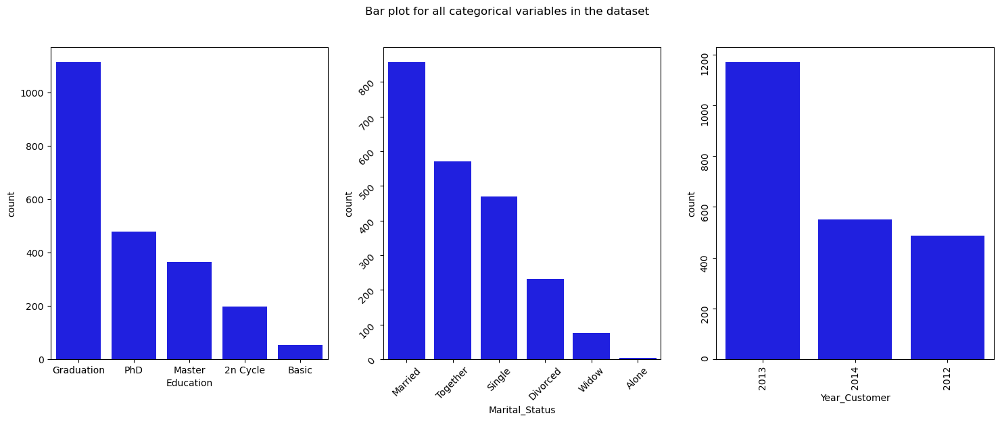

In [34]:
fig, axes = plt.subplots(1, 3, figsize=(18, 6))  # Create one row with three columns of subplots
fig.suptitle('Bar plot for all categorical variables in the dataset')

sns.countplot(ax=axes[0], x='Education', data=df, color='blue',
              order=df['Education'].value_counts().index)
sns.countplot(ax=axes[1], x='Marital_Status', data=df, color='blue',
              order=df['Marital_Status'].value_counts().index)
sns.countplot(ax=axes[2], x='Year_Customer', data=df, color='blue',
              order=df['Year_Customer'].value_counts().index)

# Rotate the x-axis labels of the last two plots
axes[1].tick_params(labelrotation=45)
axes[2].tick_params(labelrotation=90)

plt.show()

##### Education
50% of all customers are with Education "Graduation". Around 12 %  - 2nCycle and Basic. 
##### Marital_Status
38% with Married status, 24 % Together and Single make around 84 % of customers. 
##### Year_Customer
52% customer came to the company in 2013. It was the best year. The next question is "Why"?

## EDA for the relationship between different variables

In [35]:
#EDA Education vs. Products
#50%  - Graduation
#22% - PhD
#17 - Master Education
#10% - 2nCycle
#2% - Basic

product_columns = ['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']

# Calculate the mean spending for each product category based on education level
mean_spending_by_education = df.groupby("Education")[product_columns].mean()

print(mean_spending_by_education)

              MntWines  MntFruits  MntMeatProducts  MntFishProducts  \
Education                                                             
2n Cycle    202.757576  29.626263       136.378788        48.454545   
Basic         7.240741  11.111111        11.444444        17.055556   
Graduation  285.126571  30.812388       180.588869        43.297127   
Master      333.236264  21.250000       161.994505        31.032967   
PhD         406.851464  19.958159       169.418410        26.811715   

            MntSweetProducts  MntGoldProds  
Education                                   
2n Cycle           35.055556     47.217172  
Basic              12.111111     22.833333  
Graduation         31.286355     50.543986  
Master             20.865385     39.851648  
PhD                20.328452     31.962343  


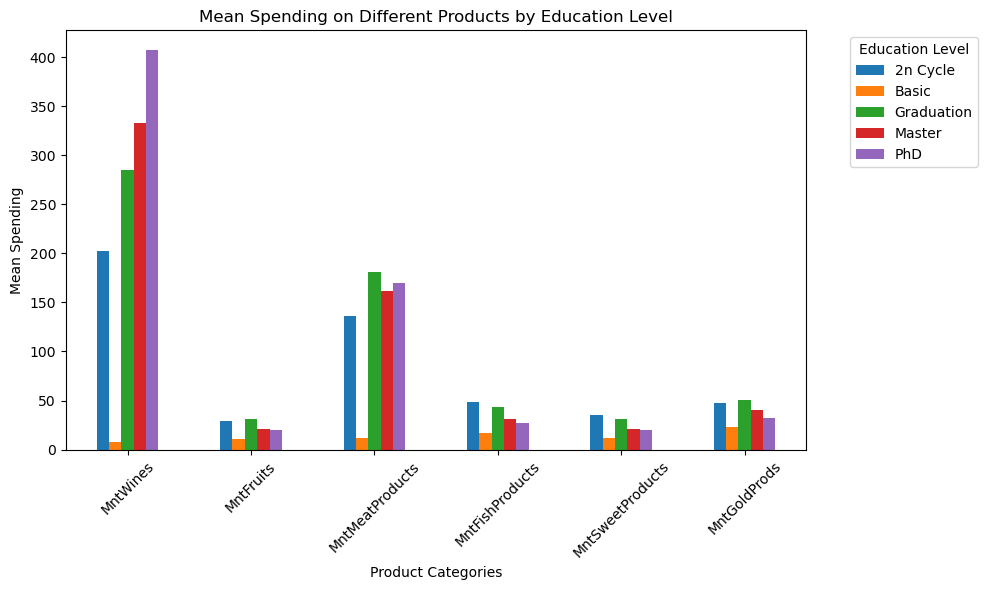

In [36]:
mean_spending_by_education = mean_spending_by_education.T

# Plot the mean spending for each product category based on education level
ax = mean_spending_by_education.plot(kind='bar', figsize=(10, 6))
ax.set_xlabel('Product Categories')
ax.set_ylabel('Mean Spending')
ax.set_title('Mean Spending on Different Products by Education Level')
plt.xticks(rotation=45)
plt.legend(title='Education Level', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


Better educated people consume more wine.

All groups spend the most on wine and meat. 

In the case of meat, fish, sweets, fruit, there is no significant tendency depending on the education.

People with little education spend little. But we have to look at how many people with little education there are in relation to other groups, what age they are.

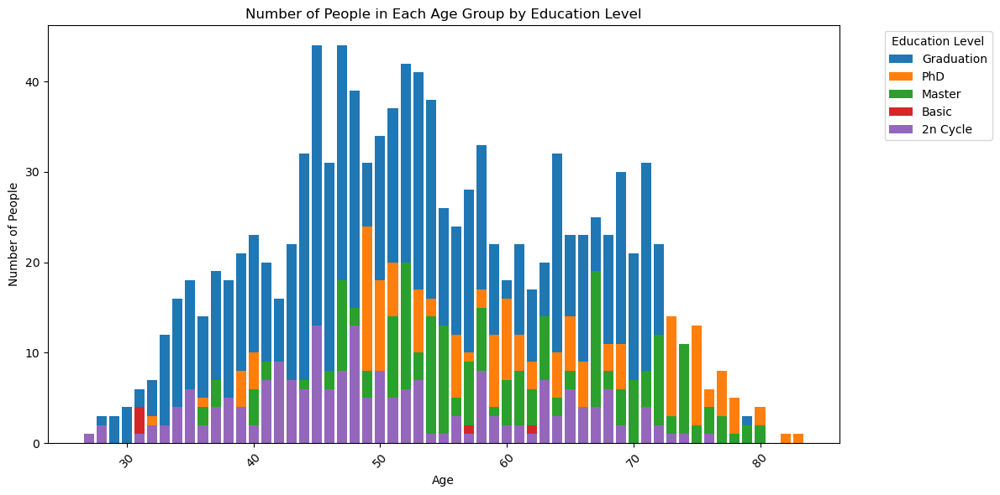

In [37]:
education_levels = df['Education'].unique()

# Plot individual bar plots for each education level
plt.figure(figsize=(12, 6))

for education_level in education_levels:
    data_subset = df[df['Education'] == education_level]
    cust_count = data_subset.groupby("Age").count()['ID']
    plt.bar(cust_count.index, cust_count.values, label=education_level)

plt.xlabel('Age')
plt.ylabel('Number of People')
plt.title('Number of People in Each Age Group by Education Level')
plt.legend(title='Education Level', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

First of all, our main customers are people between 33 - 72 years old.

Age doesn't matter with Basic education(31, 57, 62 years old). But the number of people in this group is relatively small compared to others. This can only mean that this group is less likely to buy from this store, which could be due to the price.

So our most important groups in the falls are more educated people.

In [38]:
#EDA Marita_Status vs. Products 
#38% - Married
#24% - Together
#22% - Single
#11% - Divorced
#4% - Widow
#1% - Alone
mean_spending_by_marital_status = df.groupby("Marital_Status")[product_columns].mean()

print(mean_spending_by_marital_status)

                  MntWines  MntFruits  MntMeatProducts  MntFishProducts  \
Marital_Status                                                            
Alone           184.666667   4.000000        26.333333         7.666667   
Divorced        326.186147  27.519481       150.822511        35.164502   
Married         299.855309  25.648775       160.896149        35.466744   
Single          291.934043  27.319149       185.231915        38.840426   
Together        308.145359  25.313485       166.014011        39.003503   
Widow           367.131579  31.868421       185.328947        49.907895   

                MntSweetProducts  MntGoldProds  
Marital_Status                                  
Alone                   7.000000     27.000000  
Divorced               26.917749     46.380952  
Married                26.751459     42.845974  
Single                 27.129787     43.393617  
Together               26.210158     42.938704  
Widow                  37.868421     55.855263  


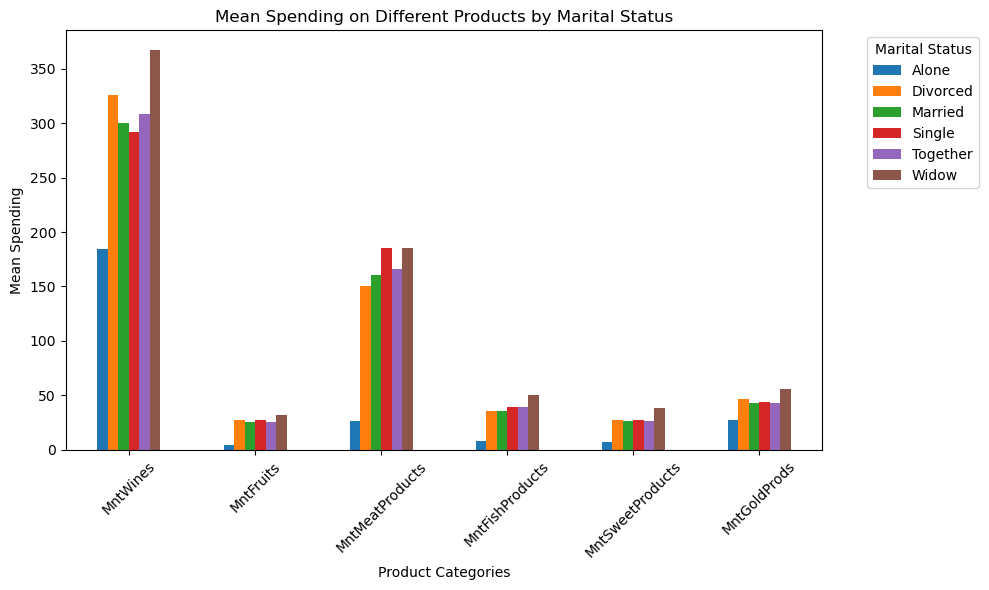

In [39]:
mean_spending_by_marital_status = mean_spending_by_marital_status.T

# Plot the mean spending for each product category based on education level
ax = mean_spending_by_marital_status.plot(kind='bar', figsize=(10, 6))
ax.set_xlabel('Product Categories')
ax.set_ylabel('Mean Spending')
ax.set_title('Mean Spending on Different Products by Marital Status')
plt.xticks(rotation=45)
plt.legend(title='Marital Status', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

Here we see a similar trend as with education. Wine and meat consumption are the most purchased products in all groups. Widow and Divorced drink the most wine. Divaced and Widow together make up 15% of all groups. But mostly consume wine. That is, we can expand the group to get more profit. However, the main groups for profit remain married and together.

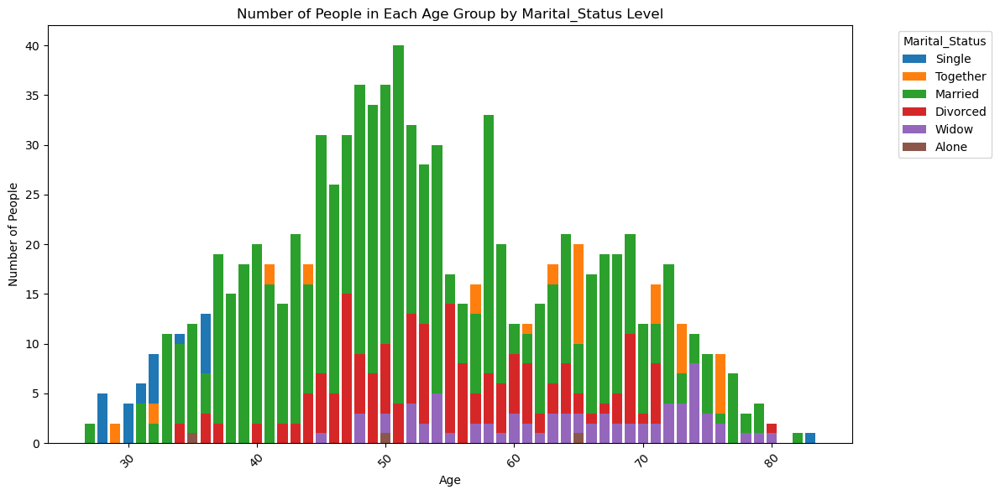

In [40]:
education_levels = df['Marital_Status'].unique()

# Plot individual bar plots for each education level
plt.figure(figsize=(12, 6))

for education_level in education_levels:
    data_subset = df[df['Marital_Status'] == education_level]
    cust_count = data_subset.groupby("Age").count()['ID']
    plt.bar(cust_count.index, cust_count.values, label=education_level)

plt.xlabel('Age')
plt.ylabel('Number of People')
plt.title('Number of People in Each Age Group by Marital_Status Level')
plt.legend(title='Marital_Status', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Most people Widow (53-74) or Divorced (44-around 60 years old) status. With this information we can make more targeted marketing campaigns.There could still be potential for sale.

But the main group for most products is Married. 

Singles are 22% of all groups and are between 28 - 36 years old.
Alone is only 1%. But this group could be combined with a single.Therefore, this division is hardly relevant.


In [41]:
#EDA Kidhome vs.Products
cust_count1=df.groupby("Kidhome").count()['ID']
cust_count1

Kidhome
0    1277
1     885
2      46
Name: ID, dtype: int64

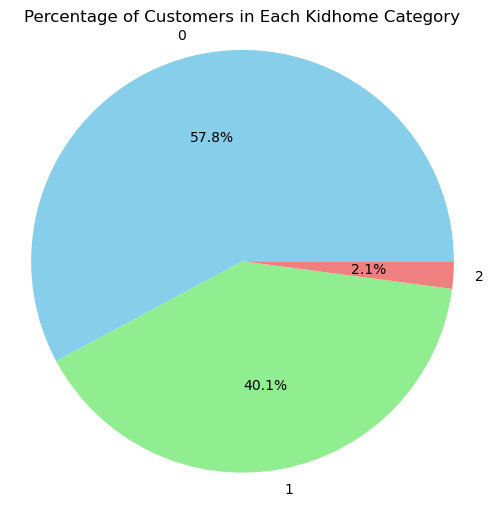

In [42]:
cust_count1 = df['Kidhome'].value_counts()

# Calculate the percentage of customers in each Kidhome category
total_customers = len(df)
cust_percent = cust_count1 / total_customers * 100

# Plot the distribution as a pie chart
plt.figure(figsize=(6, 6))
plt.pie(cust_percent, labels=cust_percent.index, autopct='%1.1f%%', colors=['skyblue', 'lightgreen', 'lightcoral'])
plt.title('Percentage of Customers in Each Kidhome Category')
plt.axis('equal')  # Equal aspect ratio ensures that the pie chart is circular.
plt.show()

In [43]:
mean_spending_by_kidhome = df.groupby("Kidhome")[product_columns].mean()

print(mean_spending_by_kidhome)

           MntWines  MntFruits  MntMeatProducts  MntFishProducts  \
Kidhome                                                            
0        452.703994  39.335944       253.584182        56.119812   
1        104.549153   8.537853        49.190960        12.292655   
2         72.000000   6.043478        30.086957         6.869565   

         MntSweetProducts  MntGoldProds  
Kidhome                                  
0               40.678935     59.765074  
1                8.625989     22.119774  
2                3.891304     16.869565  


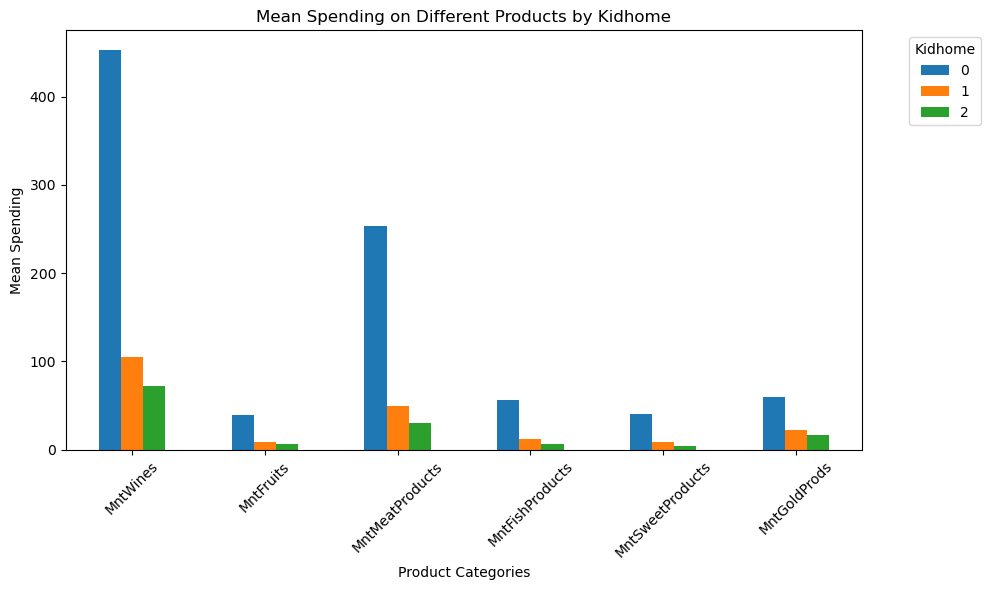

In [44]:
mean_spending_by_kidhome = mean_spending_by_kidhome.T

# Plot the mean spending for each product category based on education level
ax = mean_spending_by_kidhome.plot(kind='bar', figsize=(10, 6))
ax.set_xlabel('Product Categories')
ax.set_ylabel('Mean Spending')
ax.set_title('Mean Spending on Different Products by Kidhome')
plt.xticks(rotation=45)
plt.legend(title='Kidhome', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

Most products are bought by people without children.

People with 2 children are the least likely to buy.

For all groups, the existing trend remains: 1st place - wine, 2nd place - meat.

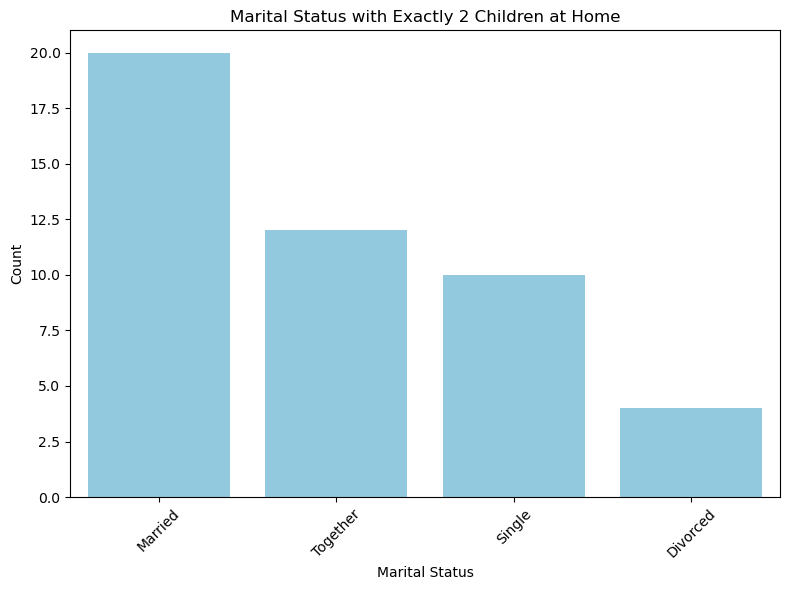

In [45]:
df_filtered_marital_status = df[df['Kidhome'] == 2]

# Get the count of each marital status category in the filtered DataFrame
marital_status_count = df_filtered_marital_status['Marital_Status'].value_counts()

# Plot the count of each marital status category where Kidhome is exactly 2
plt.figure(figsize=(8, 6))
sns.barplot(x=marital_status_count.index, y=marital_status_count.values, color='skyblue')
plt.xlabel('Marital Status')
plt.ylabel('Count')
plt.title('Marital Status with Exactly 2 Children at Home')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Marital status does not matter as all biggest groups (married, togehter, single, divorced) are represented by two children. This means that customers with two children generally shop less or rather spar more. Or bay in other shops/discounter because of prices.
For our business model we should focus on customers without children or with one child.

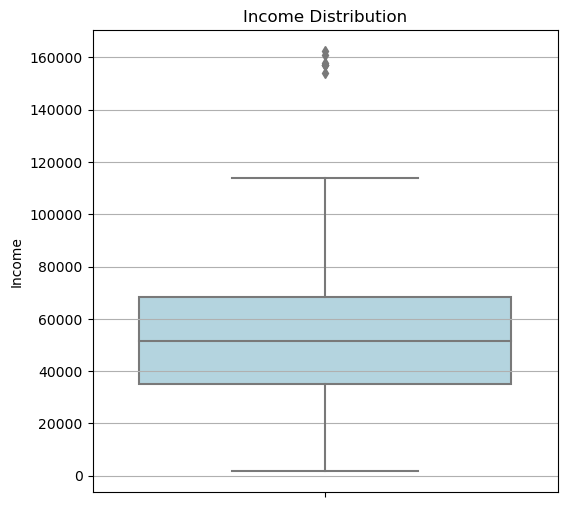

In [46]:
#Average income
import seaborn as sns

plt.figure(figsize=(6, 6))
sns.boxplot(y='Income', data=df, color='lightblue')
plt.ylabel('Income')
plt.title('Income Distribution')
plt.grid(axis='y')
plt.show()

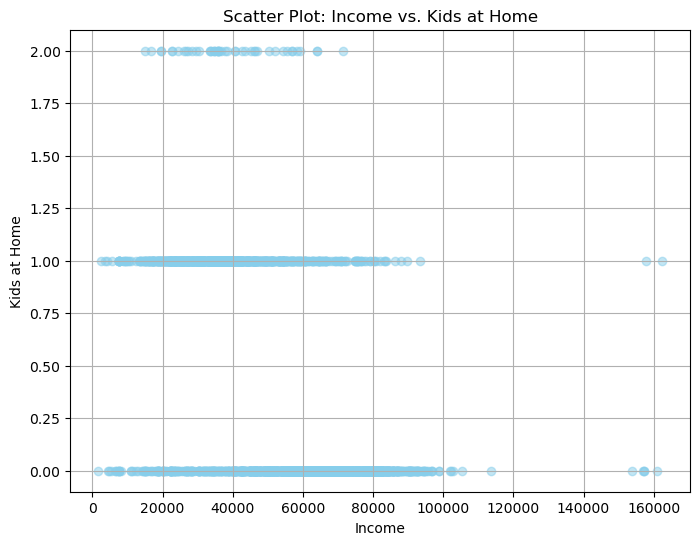

In [47]:
# Relationship between Incom and Kidhome variable.
plt.figure(figsize=(8, 6))
plt.scatter(df['Income'], df['Kidhome'], color='skyblue', alpha=0.5)
plt.xlabel('Income')
plt.ylabel('Kids at Home')
plt.title('Scatter Plot: Income vs. Kids at Home')
plt.grid(True)
plt.show()

Kindhome variable affects minimal income for customers with 0 children as well as customers with 1 child. With 0 children have a little bit more Income. According to the chart, customers with 2 children have less income. In our data, however, these people are only 2%. Therefore, it should not necessarily mean that customers with two children have less income. At the same time, this also means that we should not necessarily focus on this group. 

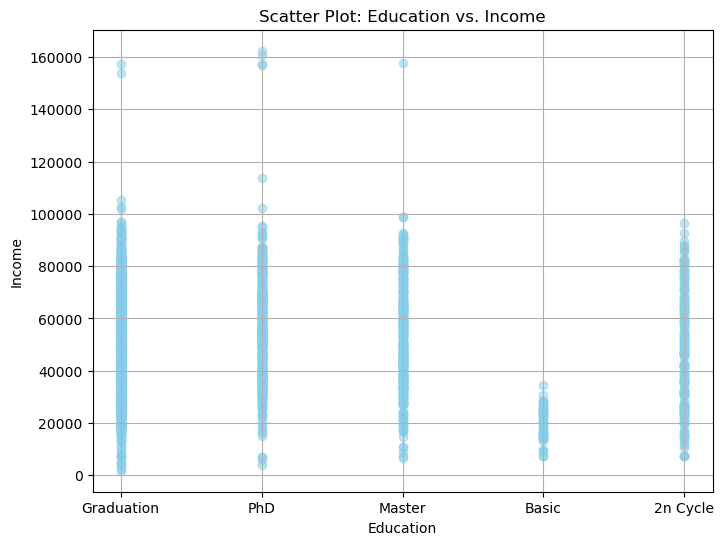

In [48]:
#EDA Education vs.Income
plt.figure(figsize=(8, 6))
plt.scatter(df['Education'], df['Income'], color='skyblue', alpha=0.5)
plt.xlabel('Education')
plt.ylabel('Income')
plt.title('Scatter Plot: Education vs. Income')
plt.grid(True)
plt.show()

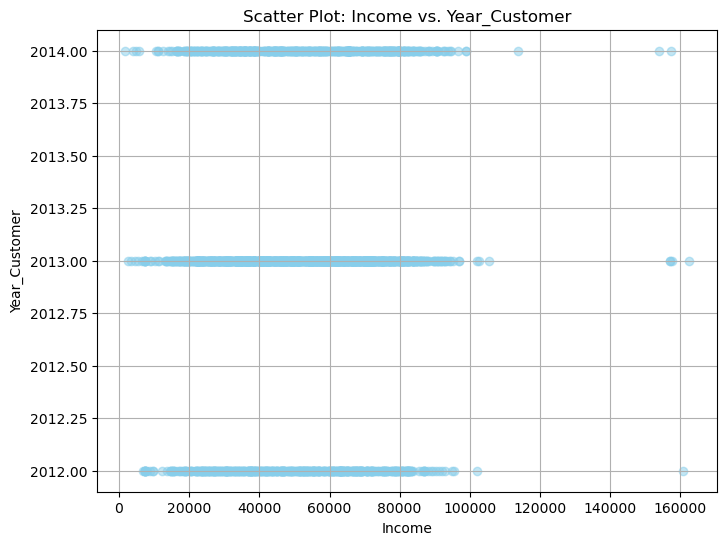

In [49]:
plt.figure(figsize=(8, 6))
plt.scatter(df['Income'], df['Year_Customer'], color='skyblue', alpha=0.5)
plt.xlabel('Income')
plt.ylabel('Year_Customer')
plt.title('Scatter Plot: Income vs. Year_Customer')
plt.grid(True)
plt.show()

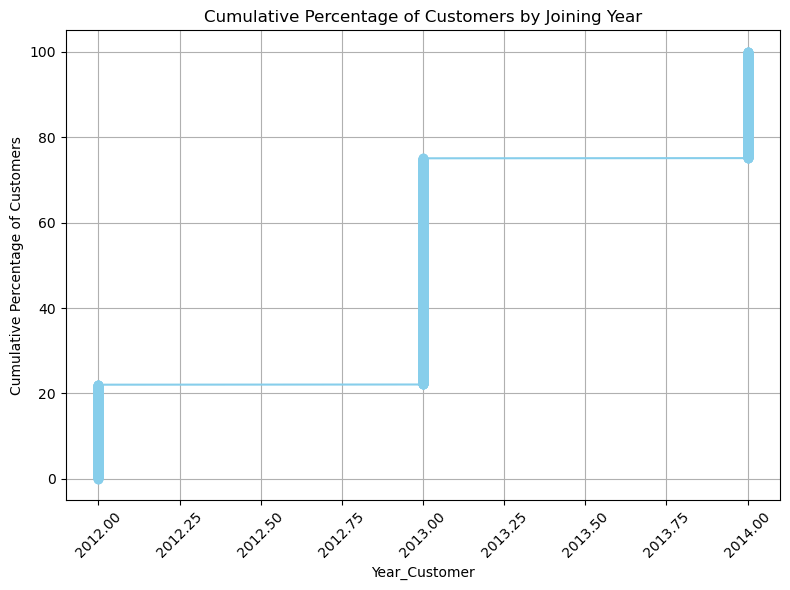

In [50]:
df_sorted = df.sort_values('Year_Customer')
total_customers = len(df_sorted)
df_sorted['Cumulative_Percentage'] = (df_sorted['Year_Customer'].rank(method='first') / total_customers) * 100

# Create a line chart to visualize the cumulative percentage of customers by their joining years
plt.figure(figsize=(8, 6))
plt.plot(df_sorted['Year_Customer'], df_sorted['Cumulative_Percentage'], marker='o', color='skyblue')
plt.xlabel('Year_Customer')
plt.ylabel('Cumulative Percentage of Customers')
plt.title('Cumulative Percentage of Customers by Joining Year')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [51]:
df_2012 = df[df['Year_Customer'] == 2012]

# Filter the data for customers from 2013
df_2013 = df[df['Year_Customer'] == 2013]

# Check if any customers from 2012 also appear in the 2013 data
common_customers = df_2012[df_2012['ID'].isin(df_2013['ID'])]

if not common_customers.empty:
    print("Customers from 2012 are also present in 2013 data.")
    print("Common customers:")
    print(common_customers['Customer_ID'])
else:
    print("No customers from 2012 are present in 2013 data.")

No customers from 2012 are present in 2013 data.


In [52]:
year_variable = 'Year_Customer'

# Get the counts of customers for each unique value in 'AcceptedCmp1' based on the specific year variable
cust_count5_by_year = df.groupby([year_variable, 'AcceptedCmp5']).size()

print("Counts of customers for each unique value in 'AcceptedCmp5', based on the specific year variable:")
print(cust_count5_by_year)

Counts of customers for each unique value in 'AcceptedCmp5', based on the specific year variable:
Year_Customer  AcceptedCmp5
2012           0                456
               1                 31
2013           0               1086
               1                 84
2014           0                506
               1                 45
dtype: int64


In [53]:
cust_count5_by_year = df.groupby([year_variable, 'AcceptedCmp5'])['ID'].count()
cust_percentage5_by_year = cust_count5_by_year.groupby(level=0).apply(lambda x: 100 * x / float(x.sum()))

print("Percentage of customers for each unique value in 'AcceptedCmp5', based on the specific year variable:")
print(cust_percentage5_by_year)

Percentage of customers for each unique value in 'AcceptedCmp5', based on the specific year variable:
Year_Customer  AcceptedCmp5
2012           0               93.634497
               1                6.365503
2013           0               92.820513
               1                7.179487
2014           0               91.833031
               1                8.166969
Name: ID, dtype: float64


C:\Users\ivann\AppData\Local\Temp\ipykernel_10736\2677262289.py:2: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  cust_percentage5_by_year = cust_count5_by_year.groupby(level=0).apply(lambda x: 100 * x / float(x.sum()))


In [54]:
cust_count4=df.groupby('AcceptedCmp4').count()['ID']
cust_count4

AcceptedCmp4
0    2044
1     164
Name: ID, dtype: int64

In [55]:
year_variable = 'Year_Customer'

# Get the counts of customers for each unique value in 'AcceptedCmp1' based on the specific year variable
cust_count4_by_year = df.groupby([year_variable, 'AcceptedCmp4']).size()

print("Counts of customers for each unique value in 'AcceptedCmp4', based on the specific year variable:")
print(cust_count4_by_year)

Counts of customers for each unique value in 'AcceptedCmp4', based on the specific year variable:
Year_Customer  AcceptedCmp4
2012           0                444
               1                 43
2013           0               1093
               1                 77
2014           0                507
               1                 44
dtype: int64


In [56]:
cust_count4_by_year = df.groupby([year_variable, 'AcceptedCmp4'])['ID'].count()
cust_percentage4_by_year = cust_count4_by_year.groupby(level=0).apply(lambda x: 100 * x / float(x.sum()))

print("Percentage of customers for each unique value in 'AcceptedCmp4', based on the specific year variable:")
print(cust_percentage4_by_year)

Percentage of customers for each unique value in 'AcceptedCmp4', based on the specific year variable:
Year_Customer  AcceptedCmp4
2012           0               91.170431
               1                8.829569
2013           0               93.418803
               1                6.581197
2014           0               92.014519
               1                7.985481
Name: ID, dtype: float64


C:\Users\ivann\AppData\Local\Temp\ipykernel_10736\601957419.py:2: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  cust_percentage4_by_year = cust_count4_by_year.groupby(level=0).apply(lambda x: 100 * x / float(x.sum()))


In [57]:
cust_count3=df.groupby('AcceptedCmp3').count()['ID']
cust_count3

AcceptedCmp3
0    2045
1     163
Name: ID, dtype: int64

In [58]:
year_variable = 'Year_Customer'

# Get the counts of customers for each unique value in 'AcceptedCmp1' based on the specific year variable
cust_count3_by_year = df.groupby([year_variable, 'AcceptedCmp3']).size()

print("Counts of customers for each unique value in 'AcceptedCmp3', based on the specific year variable:")
print(cust_count3_by_year)

Counts of customers for each unique value in 'AcceptedCmp3', based on the specific year variable:
Year_Customer  AcceptedCmp3
2012           0                450
               1                 37
2013           0               1090
               1                 80
2014           0                505
               1                 46
dtype: int64


In [59]:
cust_count3_by_year = df.groupby([year_variable, 'AcceptedCmp3'])['ID'].count()
cust_percentage3_by_year = cust_count3_by_year.groupby(level=0).apply(lambda x: 100 * x / float(x.sum()))

print("Percentage of customers for each unique value in 'AcceptedCmp3', based on the specific year variable:")
print(cust_percentage3_by_year)

Percentage of customers for each unique value in 'AcceptedCmp3', based on the specific year variable:
Year_Customer  AcceptedCmp3
2012           0               92.402464
               1                7.597536
2013           0               93.162393
               1                6.837607
2014           0               91.651543
               1                8.348457
Name: ID, dtype: float64


C:\Users\ivann\AppData\Local\Temp\ipykernel_10736\3143325348.py:2: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  cust_percentage3_by_year = cust_count3_by_year.groupby(level=0).apply(lambda x: 100 * x / float(x.sum()))


In [60]:
cust_count2=df.groupby('AcceptedCmp2').count()['ID']
cust_count2

AcceptedCmp2
0    2178
1      30
Name: ID, dtype: int64

In [61]:
year_variable = 'Year_Customer'

# Get the counts of customers for each unique value in 'AcceptedCmp1' based on the specific year variable
cust_count2_by_year = df.groupby([year_variable, 'AcceptedCmp2']).size()

print("Counts of customers for each unique value in 'AcceptedCmp2', based on the specific year variable:")
print(cust_count2_by_year)

Counts of customers for each unique value in 'AcceptedCmp2', based on the specific year variable:
Year_Customer  AcceptedCmp2
2012           0                480
               1                  7
2013           0               1155
               1                 15
2014           0                543
               1                  8
dtype: int64


In [62]:
cust_count2_by_year = df.groupby([year_variable, 'AcceptedCmp2'])['ID'].count()
cust_percentage2_by_year = cust_count2_by_year.groupby(level=0).apply(lambda x: 100 * x / float(x.sum()))

print("Percentage of customers for each unique value in 'AcceptedCmp2', based on the specific year variable:")
print(cust_percentage2_by_year)

Percentage of customers for each unique value in 'AcceptedCmp2', based on the specific year variable:
Year_Customer  AcceptedCmp2
2012           0               98.562628
               1                1.437372
2013           0               98.717949
               1                1.282051
2014           0               98.548094
               1                1.451906
Name: ID, dtype: float64


C:\Users\ivann\AppData\Local\Temp\ipykernel_10736\180536860.py:2: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  cust_percentage2_by_year = cust_count2_by_year.groupby(level=0).apply(lambda x: 100 * x / float(x.sum()))


In [63]:
cust_count1=df.groupby('AcceptedCmp1').count()['ID']
cust_count1

AcceptedCmp1
0    2067
1     141
Name: ID, dtype: int64

In [64]:
year_variable = 'Year_Customer'

# Get the counts of customers for each unique value in 'AcceptedCmp1' based on the specific year variable
cust_count1_by_year = df.groupby([year_variable, 'AcceptedCmp1']).size()

print("Counts of customers for each unique value in 'AcceptedCmp1', based on the specific year variable:")
print(cust_count1_by_year)

Counts of customers for each unique value in 'AcceptedCmp1', based on the specific year variable:
Year_Customer  AcceptedCmp1
2012           0                464
               1                 23
2013           0               1094
               1                 76
2014           0                509
               1                 42
dtype: int64


In [65]:
cust_count1_by_year = df.groupby([year_variable, 'AcceptedCmp1'])['ID'].count()
cust_percentage1_by_year = cust_count1_by_year.groupby(level=0).apply(lambda x: 100 * x / float(x.sum()))

print("Percentage of customers for each unique value in 'AcceptedCmp1', based on the specific year variable:")
print(cust_percentage1_by_year)

Percentage of customers for each unique value in 'AcceptedCmp1', based on the specific year variable:
Year_Customer  AcceptedCmp1
2012           0               95.277207
               1                4.722793
2013           0               93.504274
               1                6.495726
2014           0               92.377495
               1                7.622505
Name: ID, dtype: float64


C:\Users\ivann\AppData\Local\Temp\ipykernel_10736\374885631.py:2: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  cust_percentage1_by_year = cust_count1_by_year.groupby(level=0).apply(lambda x: 100 * x / float(x.sum()))


One thing that could explain why so many clients came to the company in 2013 is AcceptedCmp(all 5).Despite the fact that in 2014 more campaigns were accepted by clients as a percentage, 2013 was better because there were many more offers for all campaigns in 2013.

## Features correlation 

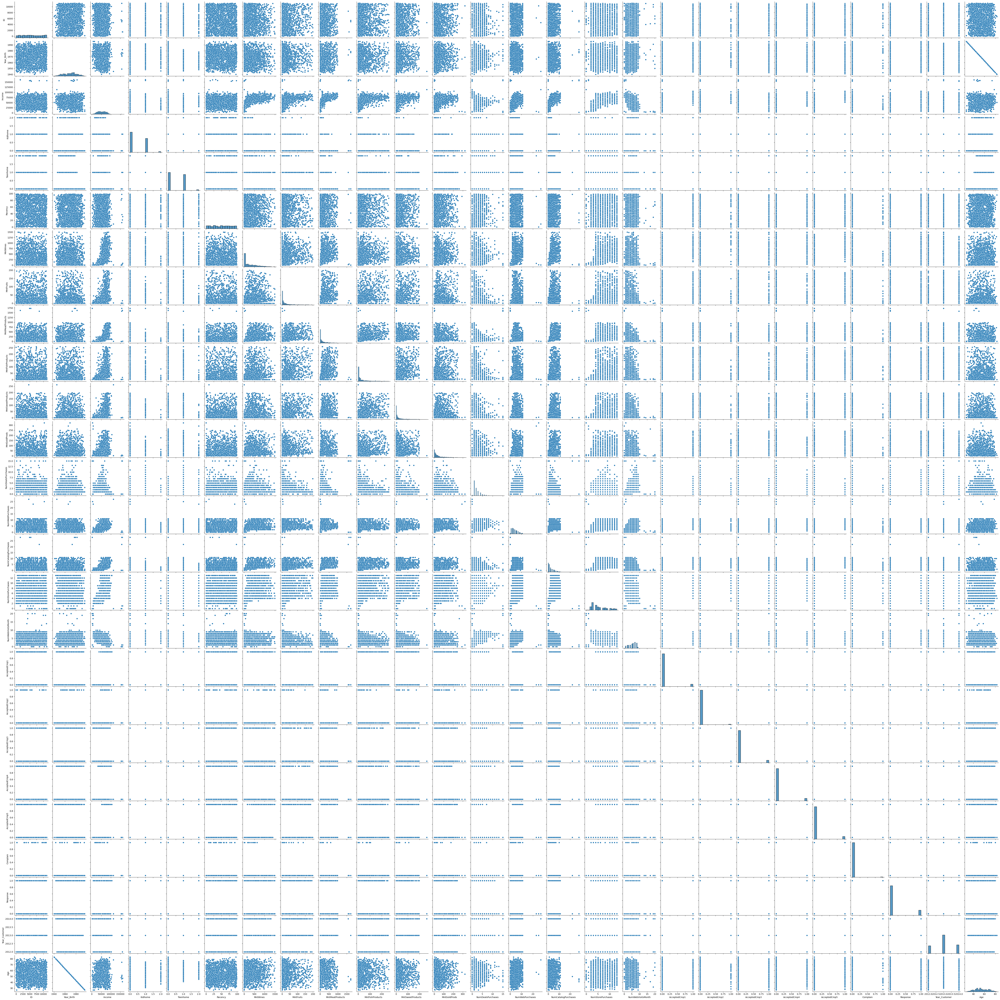

In [66]:
# Vizual relationship between different values.
numeric_df = df.select_dtypes(include='number')

# Create the pair plot using Seaborn
sns.pairplot(numeric_df)

# Display the plot
plt.show()

In [67]:
df.corr()

C:\Users\ivann\AppData\Local\Temp\ipykernel_10736\1134722465.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()


,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,NumWebVisitsMonth,AcceptedCmp1,AcceptedCmp2,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,Complain,Response,Year_Customer,Age
ID,1.000000,0.004286,0.000643,0.001132,-0.003452,-0.044256,-0.019116,0.009674,-0.003372,-0.022953,...,-0.008405,-0.019250,-0.014898,-0.035664,-0.023671,-0.005563,0.031901,-0.024124,-0.005375,-0.004286
Year_Birth,0.004286,1.000000,-0.201161,0.238589,-0.362510,-0.015534,-0.165394,-0.014599,-0.032660,-0.042812,...,0.121319,-0.015605,-0.007738,0.061400,-0.069904,0.015728,-0.004533,0.018293,-0.021589,-1.000000
Income,0.000643,-0.201161,1.000000,-0.514493,0.035540,0.007575,0.688354,0.506734,0.692645,0.519832,...,-0.650086,0.326616,0.104169,-0.014960,0.219952,0.394904,-0.027845,0.160787,0.026895,0.201161
Kidhome,0.001132,0.238589,-0.514493,1.000000,-0.039136,0.009557,-0.497392,-0.373287,-0.439483,-0.388779,...,0.447941,-0.173819,-0.082137,0.015726,-0.162644,-0.204291,0.036947,-0.076693,0.052548,-0.238589
Teenhome,-0.003452,-0.362510,0.035540,-0.039136,1.000000,0.015844,0.004033,-0.174537,-0.260523,-0.203210,...,0.129070,-0.144081,-0.015647,-0.042838,0.038194,-0.189207,0.007750,-0.154909,-0.008962,0.362510
Recency,-0.044256,-0.015534,0.007575,0.009557,0.015844,1.000000,0.016000,-0.006366,0.022253,-0.000495,...,-0.017199,-0.022162,-0.001586,-0.032773,0.017169,-0.000677,0.005593,-0.199806,-0.028537,0.015534
MntWines,-0.019116,-0.165394,0.688354,-0.497392,0.004033,0.016000,1.000000,0.386030,0.568670,0.398285,...,-0.321956,0.351951,0.206346,0.061419,0.373451,0.473505,-0.036406,0.246377,-0.154438,0.165394
MntFruits,0.009674,-0.014599,0.506734,-0.373287,-0.174537,-0.006366,0.386030,1.000000,0.546945,0.591947,...,-0.416196,0.189976,-0.009843,0.014887,0.006832,0.206755,-0.002883,0.122144,-0.054975,0.014599
MntMeatProducts,-0.003372,-0.032660,0.692645,-0.439483,-0.260523,0.022253,0.568670,0.546945,1.000000,0.573894,...,-0.539157,0.315007,0.043591,0.018461,0.091774,0.376955,-0.021019,0.239694,-0.080204,0.032660
MntFishProducts,-0.022953,-0.042812,0.519832,-0.388779,-0.203210,-0.000495,0.398285,0.591947,0.573894,1.000000,...,-0.443865,0.258425,0.002594,0.000351,0.016762,0.191278,-0.018971,0.106569,-0.068030,0.042812


C:\Users\ivann\AppData\Local\Temp\ipykernel_10736\3719159728.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  cor = df.corr()


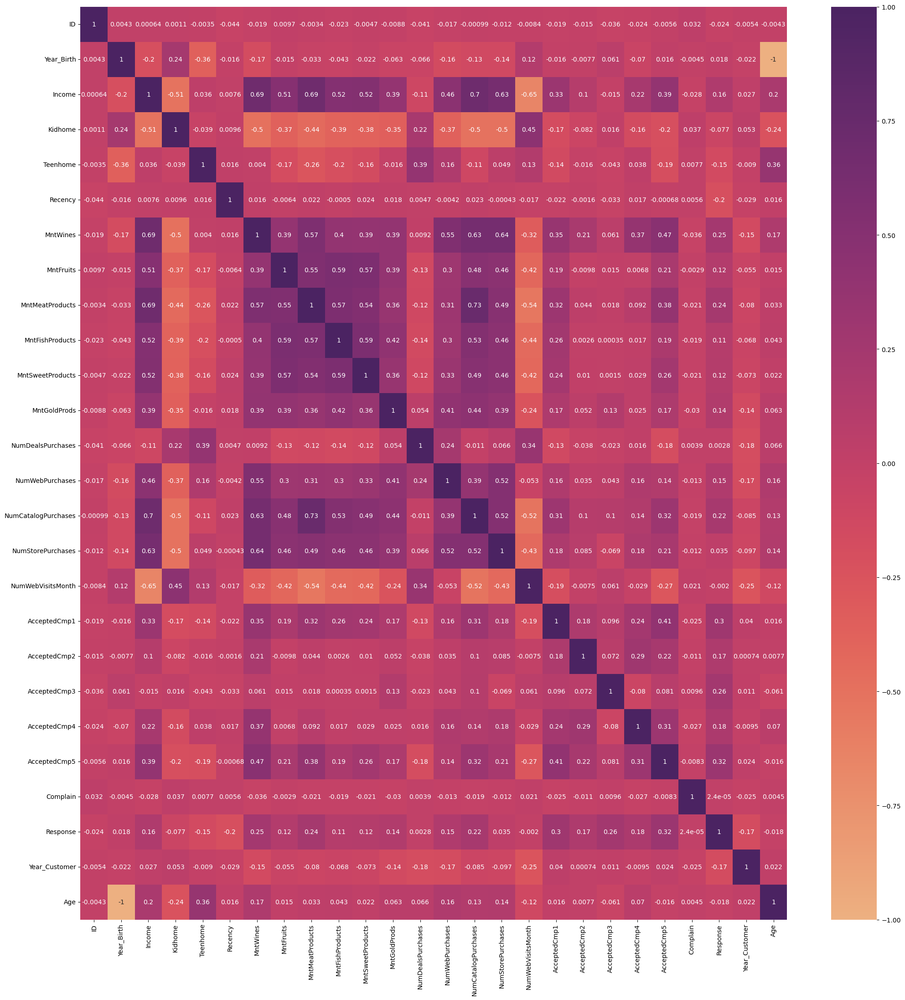

In [68]:
cor = df.corr()
plt.figure(figsize = (25,26))

sns.heatmap(cor, 
            annot = True,
            cmap = 'flare')
plt.show()